(Bayesian Vector Autoregressive Models)=
# Bayesian Vector Autoregressive Models

:::{post} Oct, 2022
:tags: time series, VARs 
:category: intermediate
:author: Ricardo Vieira, Nathaniel Forde
:::

In [1]:
import aesara as at
import arviz as az
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import statsmodels.api as sm

from pymc.sampling_jax import sample_blackjax_nuts
from statsmodels.tsa.api import VAR

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/pymc/sampling_jax.py:37: UserWarning: This module is experimental.
  warnings.warn("This module is experimental.")


In [2]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
az.style.use("arviz-darkgrid")
%config InlineBackend.figure_format = 'retina'

# Bayesian V(ector)A(uto)R(egression) Models 

In this notebook we will outline an application of the Bayesian Vector Autoregressive Modelling. We will draw on the work in the PYMC Labs blogpost. This will be a three part series. In the first we want to show how to fit Bayesian VAR models in PYMC. In the second we will show how to extract extra insight from the fitted model with Impulse Response analysis and make forecasts from the fitted VAR model. In the third and final post we will show in some more the benefits of using hierarchical priors with Bayesian VAR models. Specifically we'll outline how and why there are actually a range of carefully formulated industry standard priors which work with Bayesian VAR modelling. 

In this post we will (i) demonstrate the basic pattern on a simple VAR model on fake data and show how the model recovers the true data generating parameters and (ii) we will show an example applied to macro-economic data and compare the results to those achieved on the same data with statsmodels MLE fits and (iii) show an example of estimating a hierarchical bayesian VAR model over two countries.  

## Autoregressive Models in General

The idea of a simple autoregressive model is to capture the manner in which past observations of the timeseries are predictive of the current observation. So in traditional if we model this as a linear phenomena we get simple autoregressive models where the current value is predicted by a weighted linear combination of the past values and an error term. 

$$ y_t = \alpha + \beta_{y0} \cdot y_{t-1} + \beta_{y1} \cdot y_{t-2} ... + \epsilon $$

for however many lags are deemed appropriate to the predict the current observation. 

A VAR model is kind of generalisation of this framework in that it retains the linear combination approach but allows us to model multiple timeseries at once. So concretely this mean that $\mathbf{y}_{t}$ as a vector where:

$$ \mathbf{y}_{T} =  \nu + A_{1}\mathbf{y}_{T-1} + A_{2}\mathbf{y}_{T-2} ... A_{p}\mathbf{y}_{T-p} + \mathbf{e}_{t}  $$

where the As are coefficient matrices to be combined with the past values of each individual timeseries. For example consider an economic example where we aim to model the relationship and mutual influence of each variable on themselves and one another.

$$ \begin{bmatrix} gdp \\ inv \\ con \end{bmatrix}_{T} = \nu + A_{1}\begin{bmatrix} gdp \\ inv \\ con \end{bmatrix}_{T-1} + 
    A_{2}\begin{bmatrix} gdp \\ inv \\ con \end{bmatrix}_{T-2} ... A_{p}\begin{bmatrix} gdp \\ inv \\ con \end{bmatrix}_{T-p} + \mathbf{e}_{t} $$

This structure is compact representation using matrix notation. The thing we are trying to estimate when we fit a VAR model is the A matrix that determines the manner of the linear combination that best fits our timeseries. Such timeseries models can have an auto-regressive or a moving average representation, and the details matter for some of the implication of a VAR model fit. 

We'll see in the next notebook of the series how the moving-average representation of a VAR lends itself to the interpretation of the covariance structure in our model as representing a kind of impulse-response relationship between the component timeseries. 

### A Concrete Specification with Two lagged Terms

The matrix notation is convenient to suggest the broad patterns of the model, but it is useful to see the algebra is a simple case. Consider the case of Ireland's GDP and consumption described as: 

$$ gdp_{t} = \beta_{gdp1} \cdot gdp_{t-1} + \beta_{gdp2} \cdot gdp_{t-2} +  \beta_{cons1} \cdot cons_{t-1} + \beta_{cons2} \cdot cons_{t-2}  + \epsilon_{gdp}$$
$$ cons_{t} = \beta_{cons1} \cdot cons_{t-1} + \beta_{cons2} \cdot cons_{t-2} +  \beta_{gdp1} \cdot gdp_{t-1} + \beta_{gdp2} \cdot gdp_{t-2}  + \epsilon_{cons}$$

In this manner we can see that if we can estimate the $\beta$ terms we have an estimate for the bi-directional effects of each variable on the other. This is a useful feature of the modelling. In what follows i should stress that i'm not an economist and I'm aiming to show only the functionality of these models not give you a decisive opinion about the economic relationships determining Irish GDP figures. 

### Creating some Fake Data

In [3]:
def simulate_var(
    intercepts, coefs_yy, coefs_xy, coefs_xx, coefs_yx, noises=(1, 1), *, warmup=100, steps=200
):
    draws_y = np.zeros(warmup + steps)
    draws_x = np.zeros(warmup + steps)
    draws_y[:2] = intercepts[0]
    draws_x[:2] = intercepts[1]
    for step in range(2, warmup + steps):
        draws_y[step] = (
            intercepts[0]
            + coefs_yy[0] * draws_y[step - 1]
            + coefs_yy[1] * draws_y[step - 2]
            + coefs_xy[0] * draws_x[step - 1]
            + coefs_xy[1] * draws_x[step - 2]
            + rng.normal(0, noises[0])
        )
        draws_x[step] = (
            intercepts[1]
            + coefs_xx[0] * draws_x[step - 1]
            + coefs_xx[1] * draws_x[step - 2]
            + coefs_yx[0] * draws_y[step - 1]
            + coefs_yx[1] * draws_y[step - 2]
            + rng.normal(0, noises[1])
        )
    return draws_y[warmup:], draws_x[warmup:]

First we generate some fake data with known parameters.

In [4]:
var_y, var_x = simulate_var(
    intercepts=(18, 8),
    coefs_yy=(-0.8, 0),
    coefs_xy=(0.9, 0),
    coefs_xx=(1.3, -0.7),
    coefs_yx=(-0.1, 0.3),
)

df = pd.DataFrame({"x": var_x, "y": var_y})
df.head()

,x,y
0,34.606613,30.117581
1,34.773803,23.996700
2,35.455237,29.738941
3,33.886706,27.193417
4,31.837465,26.704728


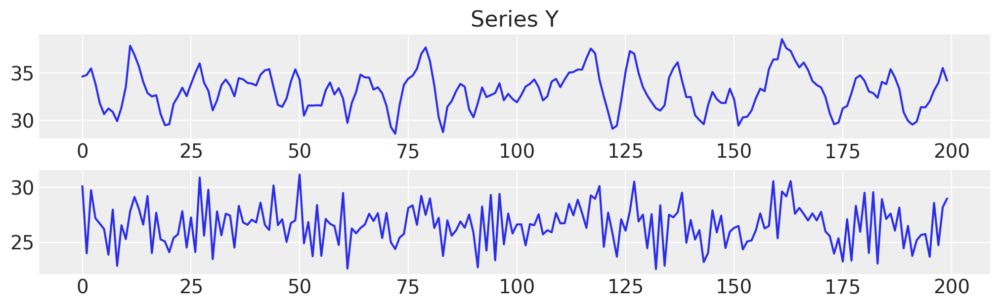

In [5]:
fig, axs = plt.subplots(2, 1, figsize=(10, 3))
axs[0].plot(df["x"], label="x")
axs[0].set_title("Series X")
axs[1].plot(df["y"], label="y")
axs[0].set_title("Series Y");

## Handling Multiple Lags and Different Dimensions

When Modelling multiple timeseries and accounting for potentially any number lags to incorporate in our model we need to abstract some of the model definition to helper functions. An example will make this a bit clearer.

In [6]:
### Define a helper function that will construct our autoregressive step for the marginal contribution of each lagged
### term in each of the respective time series equations
def calc_ar_step(lag_coefs, n_eqs, n_lags, df):
    ars = []
    for j in range(n_eqs):
        ar = pm.math.sum(
            [
                pm.math.sum(lag_coefs[j, i] * df.values[n_lags - (i + 1) : -(i + 1)], axis=-1)
                for i in range(n_lags)
            ],
            axis=0,
        )
    ars.append(ar)
    beta = pm.math.stack(ars, axis=-1)

    return beta


### Make the model in such a way that it can handle different specifications of the likelihood term
### and can be run for simple prior predictive checks. This latter functionality is important for debugging of
### shape handling issues. Building a VAR model involves quite a few moving parts and it is handy to
### inspect the shape implied in the prior predictive checks.
def make_model(n_lags, n_eqs, df, priors, mv_norm=True, prior_checks=True):
    coords = {
        "lags": np.arange(n_lags) + 1,
        "equations": df.columns.tolist(),
        "cross_vars": df.columns.tolist(),
        "time": [x for x in df.index[n_lags:]],
    }

    with pm.Model(coords=coords) as model:
        lag_coefs = pm.Normal(
            "lag_coefs",
            mu=priors["lag_coefs"]["mu"],
            sigma=priors["lag_coefs"]["sigma"],
            dims=["equations", "lags", "cross_vars"],
        )
        alpha = pm.Normal(
            "alpha", mu=priors["alpha"]["mu"], sigma=priors["alpha"]["sigma"], dims=("equations",)
        )
        data_obs = pm.Data("data_obs", df.values[n_lags:], dims=["time", "equations"], mutable=True)

        betaX = calc_ar_step(lag_coefs, n_eqs, n_lags, df)
        betaX = pm.Deterministic("betaX", betaX)
        mean = alpha + betaX

        if mv_norm:
            n = df.shape[1]
            ## Under the hood the LKJ prior will retain the correlation matrix too.
            noise_chol, _, _ = pm.LKJCholeskyCov(
                "noise_chol",
                eta=priors["noise_chol"]["eta"],
                n=n,
                sd_dist=pm.HalfNormal.dist(sigma=priors["noise_chol"]["sigma"]),
            )
            obs = pm.MvNormal("obs", mu=mean, chol=noise_chol, observed=data_obs)
        else:
            ## This is an alternative likelihood that can recover sensible estimates of the coefficients
            ## But lacks the multivariate correlation between the timeseries.
            sigma = pm.HalfNormal("noise", sigma=priors["noise"]["sigma"], dims=["equations"])
            obs = pm.Normal("obs", mu=mean, sigma=sigma, observed=data_obs)

        if prior_checks:
            idata = pm.sample_prior_predictive()
            return model, idata
        else:
            idata = pm.sample_prior_predictive()
            idata.extend(pm.sample(random_seed=100))
            pm.sample_posterior_predictive(idata, extend_inferencedata=True, random_seed=rng)
    return model, idata

The model has a deterministic component in the auto-regressive calculation which is required at each timestep, but the key point here is that we model the likelihood of the VAR as a multivariate normal distribution with a particular covariance relationship. The estimation of these covariance relationship gives the main insight in the manner in which our component timeseries relate to one another. 

We will inspect the structure of a VAR with 2 lags and 2 equations

Sampling: [alpha, lag_coefs, noise_chol, obs]
INFO:pymc:Sampling: [alpha, lag_coefs, noise_chol, obs]


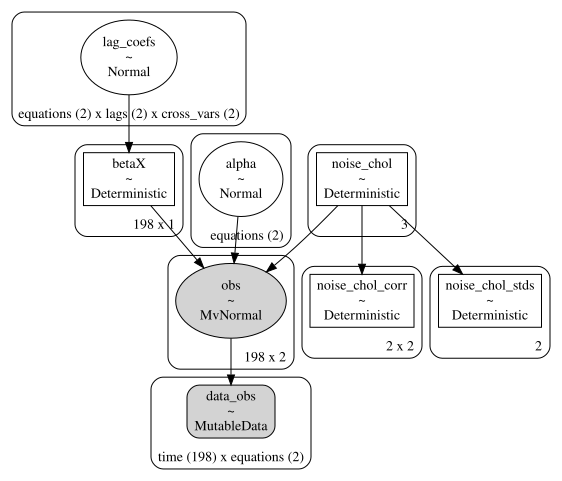

In [7]:
n_lags = 2
n_eqs = 2
priors = {
    "lag_coefs": {"mu": 0, "sigma": 1},
    "alpha": {"mu": 10, "sigma": 5},
    "noise_chol": {"eta": 1, "sigma": 1},
    "noise": {"sigma": 1},
}

model, idata = make_model(n_lags, n_eqs, df, priors)
pm.model_to_graphviz(model)

Another VAR with 3 lags and 2 equations.

Sampling: [alpha, lag_coefs, noise_chol, obs]
INFO:pymc:Sampling: [alpha, lag_coefs, noise_chol, obs]


  lag_coefs: shape=(2, 3, 2)
      alpha: shape=(2,)
noise_chol_cholesky-cov-packed__: shape=(3,)
 noise_chol: shape=(3,)


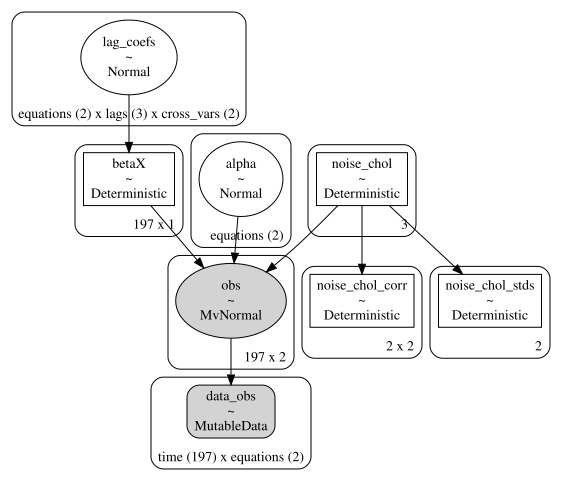

In [8]:
n_lags = 3
n_eqs = 2
model, idata = make_model(n_lags, n_eqs, df, priors)
for rv, shape in model.eval_rv_shapes().items():
    print(f"{rv:>11}: shape={shape}")
pm.model_to_graphviz(model)

We can inspect the correlation matrix between our timeseries which is implied by the prior specification, to see that we have allowed a flat uniform prior over their correlation.

/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_30847/3227435871.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  prior_corr = (idata['prior']['noise_chol_corr'].to_dataframe().reset_index()
/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_30847/3227435871.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  prior_corr = (idata['prior']['noise_chol_corr'].to_dataframe().reset_index()


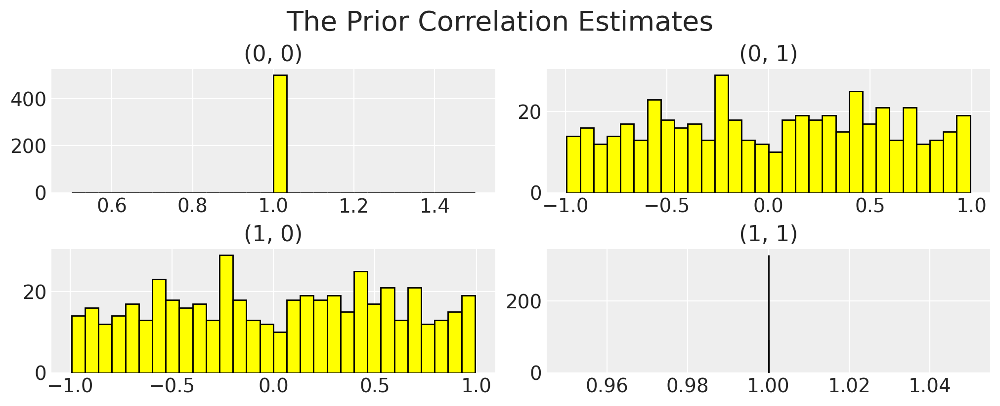

In [9]:
prior_corr = (
    idata["prior"]["noise_chol_corr"]
    .to_dataframe()
    .reset_index()
    .pivot(["chain", "draw", "noise_chol_corr_dim_0"], "noise_chol_corr_dim_1", "noise_chol_corr")
    .reset_index()
    .pivot(["chain", "draw"], "noise_chol_corr_dim_0")
)
prior_corr.columns = prior_corr.columns.to_flat_index()
fig, axs = plt.subplots(2, 2, figsize=(10, 4))
axs = axs.flatten()
for ax, col in zip(axs, prior_corr.columns):
    ax.hist(prior_corr[col], bins=30, ec="black", color="yellow")
    ax.set_title(col)
plt.suptitle("The Prior Correlation Estimates", fontsize=20);

Now we will fit the VAR with 2 lags and 2 equations

In [10]:
n_lags = 2
n_eqs = 2
model, idata_fake_data = make_model(n_lags, n_eqs, df, priors, prior_checks=False)

Sampling: [alpha, lag_coefs, noise_chol, obs]
INFO:pymc:Sampling: [alpha, lag_coefs, noise_chol, obs]
Auto-assigning NUTS sampler...
INFO:pymc:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lag_coefs, alpha, noise_chol]
INFO:pymc:NUTS: [lag_coefs, alpha, noise_chol]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 543 seconds.
INFO:pymc:Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 543 seconds.
Sampling: [obs]
INFO:pymc:Sampling: [obs]


In [11]:
az.summary(idata_fake_data, var_names=["alpha", "lag_coefs", "noise_chol_corr"])

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[x],15.379,1.342,12.846,17.848,0.034,0.024,1588.0,2374.0,1.0
alpha[y],8.849,1.344,6.500,11.510,0.034,0.024,1587.0,2204.0,1.0
"lag_coefs[x, 1, x]",-0.000,0.985,-1.877,1.814,0.015,0.018,4380.0,2357.0,1.0
"lag_coefs[x, 1, y]",-0.001,0.995,-1.980,1.755,0.016,0.018,3763.0,2586.0,1.0
"lag_coefs[x, 2, x]",0.024,1.022,-1.982,1.846,0.016,0.017,3960.0,2752.0,1.0
"lag_coefs[x, 2, y]",-0.007,0.998,-1.864,1.853,0.016,0.016,3823.0,2681.0,1.0
"lag_coefs[y, 1, x]",1.098,0.046,1.010,1.185,0.001,0.001,2736.0,2569.0,1.0
"lag_coefs[y, 1, y]",-0.440,0.054,-0.543,-0.341,0.001,0.001,1703.0,2404.0,1.0
"lag_coefs[y, 2, x]",-0.332,0.073,-0.461,-0.191,0.002,0.001,1858.0,2388.0,1.0
"lag_coefs[y, 2, y]",0.152,0.052,0.052,0.248,0.001,0.001,1753.0,2325.0,1.0


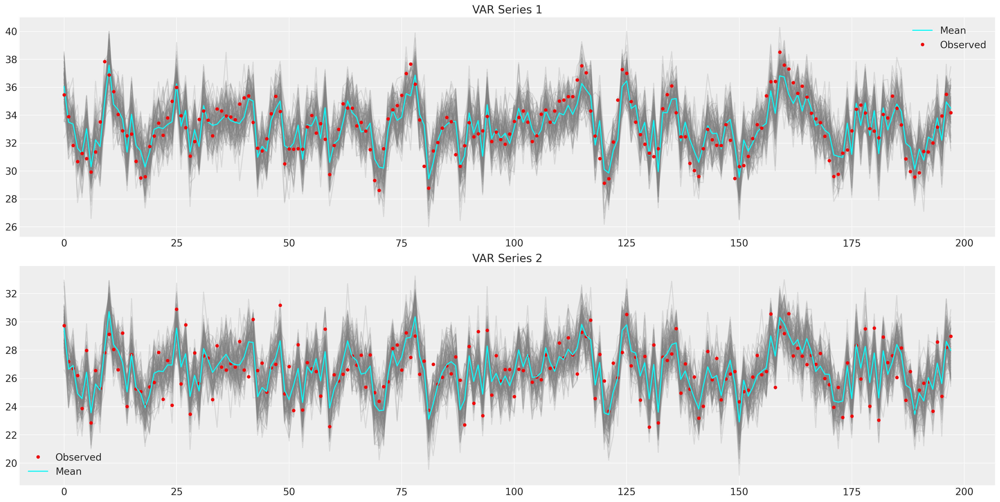

In [12]:
def plot_ppc(idata, df, group="posterior_predictive"):
    fig, axs = plt.subplots(2, 1, figsize=(20, 10))
    df = pd.DataFrame(idata_fake_data["observed_data"]["obs"].data, columns=["x", "y"])
    axs = axs.flatten()
    ppc = az.extract_dataset(idata, group=group, num_samples=100)["obs"]
    # Minus the lagged terms and the constant
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color="grey", alpha=0.2)
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color="cyan", label="Mean")
    axs[0].plot(df["x"], "o", color="red", markersize=4, label="Observed")
    axs[0].set_title("VAR Series 1")
    axs[0].legend()
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color="grey", alpha=0.2)
    axs[1].plot(df["y"], "o", color="red", markersize=4, label="Observed")
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color="cyan", label="Mean")
    axs[1].set_title("VAR Series 2")
    axs[1].legend()


plot_ppc(idata_fake_data, df)

We can see here how the modelling has recovered the broadly correct relationships between the two series. The impact of x's first lag on y is a little higher than in the actual case, but the alpha parameters are basically correct. To visualise this a little more clearly we can examine the posterior predictive checks to see how this system can replicate the observed data. 

Again we can check the learned posterior distribution for the correlation parameter.

/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_30847/129239910.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_fake_data['posterior']['noise_chol_corr'].to_dataframe().reset_index()
/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_30847/129239910.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_fake_data['posterior']['noise_chol_corr'].to_dataframe().reset_index()


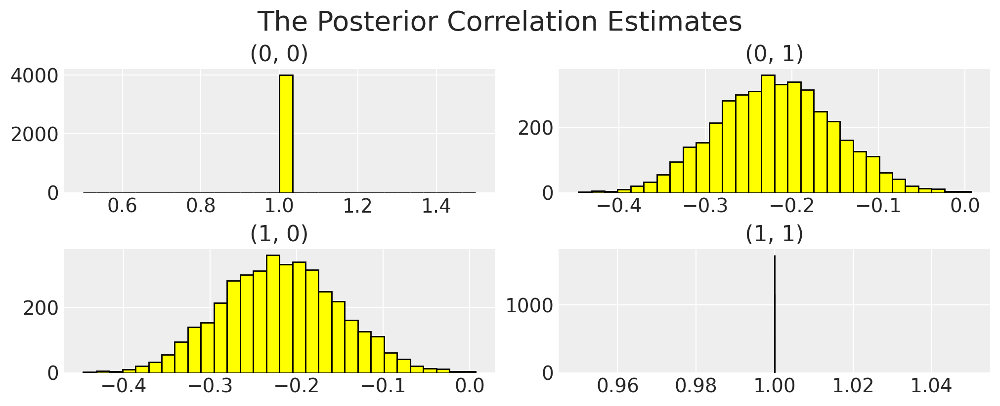

In [13]:
post_corr = (
    idata_fake_data["posterior"]["noise_chol_corr"]
    .to_dataframe()
    .reset_index()
    .pivot(["chain", "draw", "noise_chol_corr_dim_0"], "noise_chol_corr_dim_1", "noise_chol_corr")
    .reset_index()
    .pivot(["chain", "draw"], "noise_chol_corr_dim_0")
)
post_corr.columns = post_corr.columns.to_flat_index()
fig, axs = plt.subplots(2, 2, figsize=(10, 4))
axs = axs.flatten()
for ax, col in zip(axs, post_corr.columns):
    ax.hist(post_corr[col], bins=30, ec="black", color="yellow")
    ax.set_title(col)
plt.suptitle("The Posterior Correlation Estimates", fontsize=20);

## Applying the Theory: Macro Economic Timeseries

In [14]:
gdp_hierarchical = pd.read_csv("../data/gdp_data_hierarchical_clean.csv", index_col=0)
gdp_hierarchical

,country,iso2c,iso3c,year,GDP,CONS,GFCF,dl_gdp,dl_cons,dl_gfcf,more_than_10,time
1,Australia,AU,AUS,1971,4.647670e+11,3.113170e+11,7.985100e+10,0.039217,0.040606,0.031705,True,1
2,Australia,AU,AUS,1972,4.829350e+11,3.229650e+11,8.209200e+10,0.038346,0.036732,0.027678,True,2
3,Australia,AU,AUS,1973,4.955840e+11,3.371070e+11,8.460300e+10,0.025855,0.042856,0.030129,True,3
4,Australia,AU,AUS,1974,5.159300e+11,3.556010e+11,8.821400e+10,0.040234,0.053409,0.041796,True,4
5,Australia,AU,AUS,1975,5.228210e+11,3.759000e+11,8.255900e+10,0.013268,0.055514,-0.066252,True,5
...,...,...,...,...,...,...,...,...,...,...,...,...
366,United States,US,USA,2016,1.850960e+13,1.522497e+13,3.802207e+12,0.016537,0.023425,0.021058,True,44
367,United States,US,USA,2017,1.892712e+13,1.553075e+13,3.947418e+12,0.022306,0.019885,0.037480,True,45
368,United States,US,USA,2018,1.947957e+13,1.593427e+13,4.119951e+12,0.028771,0.025650,0.042780,True,46
369,United States,US,USA,2019,1.992544e+13,1.627888e+13,4.248643e+12,0.022631,0.021396,0.030758,True,47


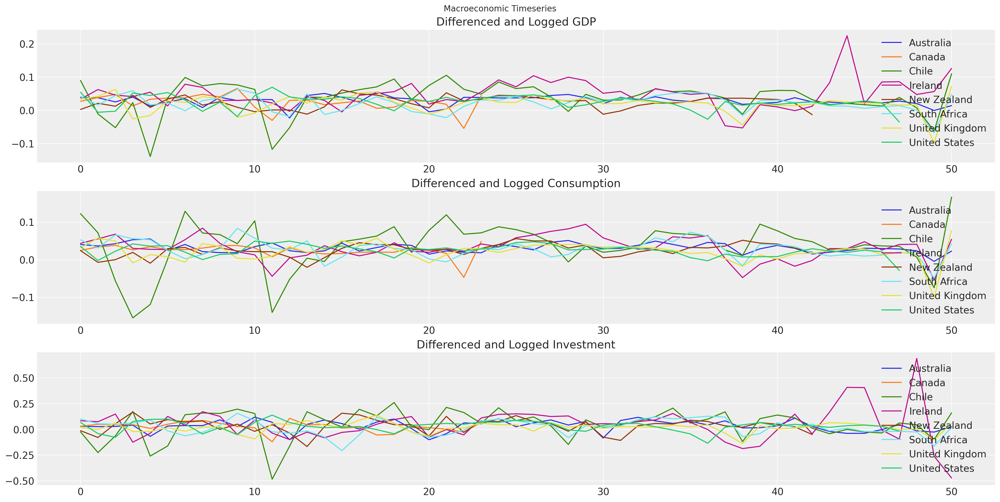

In [15]:
fig, axs = plt.subplots(3, 1, figsize=(20, 10))
for country in gdp_hierarchical["country"].unique():
    temp = gdp_hierarchical[gdp_hierarchical["country"] == country].reset_index()
    axs[0].plot(temp["dl_gdp"], label=f"{country}")
    axs[1].plot(temp["dl_cons"], label=f"{country}")
    axs[2].plot(temp["dl_gfcf"], label=f"{country}")
axs[0].set_title("Differenced and Logged GDP")
axs[1].set_title("Differenced and Logged Consumption")
axs[2].set_title("Differenced and Logged Investment")
axs[0].legend()
axs[1].legend()
axs[2].legend()
plt.suptitle("Macroeconomic Timeseries");

## Ireland's Economic Situation

Ireland is somewhat infamous for its GDP numbers that are largely the product of foreign direct investment and inflated beyond expectation in recent years by the investment and taxation deals offered to large multi-nationals. We'll look here at just the relationship between GDP and consumption. We just want to show the mechanics of the VAR estimation, you shouldn't read too much into the subsequent analysis.

In [16]:
ireland_df = gdp_hierarchical[gdp_hierarchical["country"] == "Ireland"]
ireland_df.reset_index(inplace=True, drop=True)
ireland_df.head()

,country,iso2c,iso3c,year,GDP,CONS,GFCF,dl_gdp,dl_cons,dl_gfcf,more_than_10,time
0,Ireland,IE,IRL,1971,3.314234e+10,2.897699e+10,8.317518e+09,0.034110,0.043898,0.085452,True,1
1,Ireland,IE,IRL,1972,3.529322e+10,3.063538e+10,8.967782e+09,0.062879,0.055654,0.075274,True,2
2,Ireland,IE,IRL,1973,3.695956e+10,3.280221e+10,1.041728e+10,0.046134,0.068340,0.149828,True,3
3,Ireland,IE,IRL,1974,3.853412e+10,3.381524e+10,9.207243e+09,0.041720,0.030416,-0.123476,True,4
4,Ireland,IE,IRL,1975,4.071386e+10,3.477232e+10,8.874887e+09,0.055024,0.027910,-0.036765,True,5


In [17]:
n_lags = 2
n_eqs = 2
priors = {
    "lag_coefs": {"mu": 0, "sigma": 0.1},
    "alpha": {"mu": 0, "sigma": 1},
    "noise_chol": {"eta": 1, "sigma": 1},
    "noise": {"sigma": 1},
}
model, idata_ireland = make_model(
    n_lags, n_eqs, ireland_df[["dl_gdp", "dl_cons"]], priors, prior_checks=False
)
idata_ireland

Sampling: [alpha, lag_coefs, noise_chol, obs]
INFO:pymc:Sampling: [alpha, lag_coefs, noise_chol, obs]
Auto-assigning NUTS sampler...
INFO:pymc:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lag_coefs, alpha, noise_chol]
INFO:pymc:NUTS: [lag_coefs, alpha, noise_chol]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 76 seconds.
INFO:pymc:Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 76 seconds.
Sampling: [obs]
INFO:pymc:Sampling: [obs]


Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data

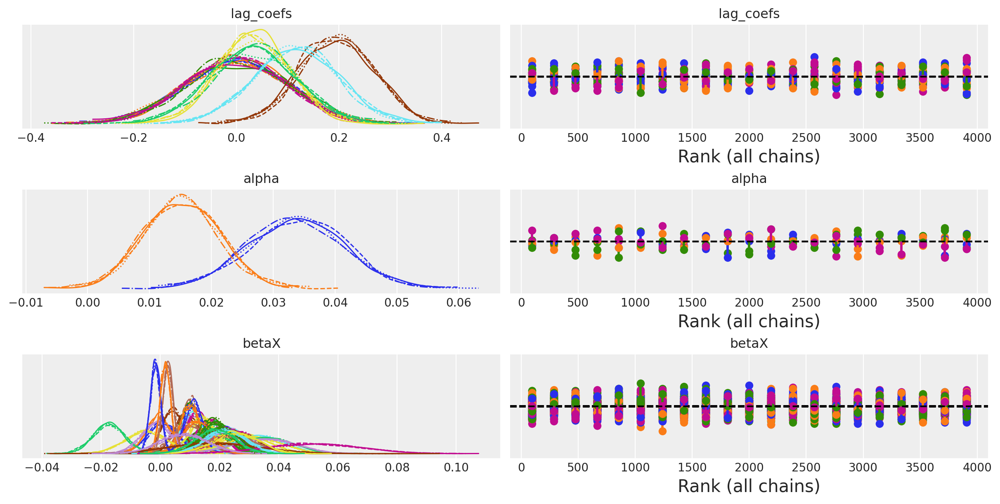

In [18]:
az.plot_trace(idata_ireland, var_names=["lag_coefs", "alpha", "betaX"], kind="rank_vlines");

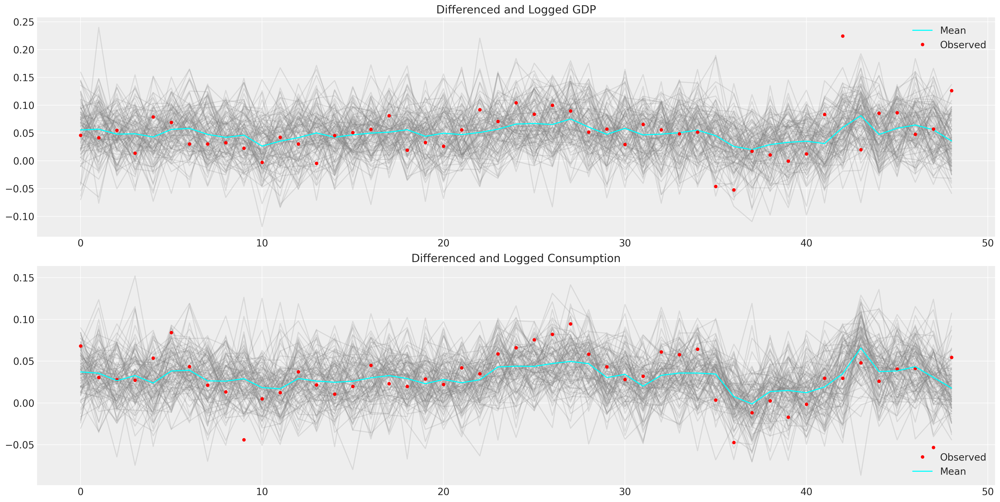

In [19]:
def plot_ppc_macro(idata, df, group="posterior_predictive"):
    df = pd.DataFrame(idata["observed_data"]["obs"].data, columns=["dl_gdp", "dl_cons"])
    fig, axs = plt.subplots(2, 1, figsize=(20, 10))
    axs = axs.flatten()
    ppc = az.extract_dataset(idata, group=group, num_samples=100)["obs"]

    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color="grey", alpha=0.2)
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color="cyan", label="Mean")
    axs[0].plot(df["dl_gdp"], "o", color="red", markersize=4, label="Observed")
    axs[0].set_title("Differenced and Logged GDP")
    axs[0].legend()
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color="grey", alpha=0.2)
    axs[1].plot(df["dl_cons"], "o", color="red", markersize=4, label="Observed")
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color="cyan", label="Mean")
    axs[1].set_title("Differenced and Logged Consumption")
    axs[1].legend()


plot_ppc_macro(idata_ireland, ireland_df)

/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_30847/2941764431.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_ireland['posterior']['noise_chol_corr'].to_dataframe().reset_index()
/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_30847/2941764431.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_ireland['posterior']['noise_chol_corr'].to_dataframe().reset_index()


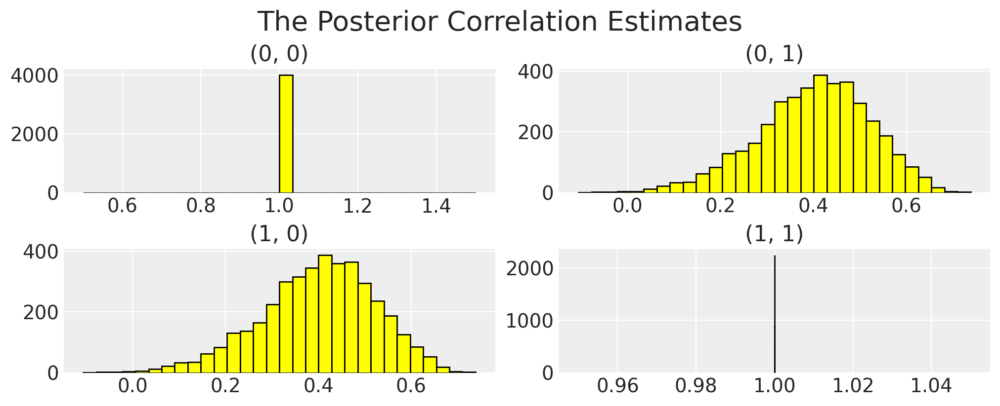

In [20]:
post_corr = (
    idata_ireland["posterior"]["noise_chol_corr"]
    .to_dataframe()
    .reset_index()
    .pivot(["chain", "draw", "noise_chol_corr_dim_0"], "noise_chol_corr_dim_1", "noise_chol_corr")
    .reset_index()
    .pivot(["chain", "draw"], "noise_chol_corr_dim_0")
)
post_corr.columns = post_corr.columns.to_flat_index()
fig, axs = plt.subplots(2, 2, figsize=(10, 4))
axs = axs.flatten()
for ax, col in zip(axs, post_corr.columns):
    ax.hist(post_corr[col], bins=30, ec="black", color="yellow")
    ax.set_title(col)
plt.suptitle("The Posterior Correlation Estimates", fontsize=20);

### Comparison with Statsmodels

It's worthwhile comparing these model fits to the one achieved by Statsmodels just to see if we can recover a similar story.

In [21]:
VAR_model = sm.tsa.VAR(ireland_df[["dl_gdp", "dl_cons"]])
results = VAR_model.fit(2, trend="c")

In [22]:
results.params

,dl_gdp,dl_cons
const,0.034145,0.006996
L1.dl_gdp,0.324904,0.330003
L1.dl_cons,0.076629,0.305824
L2.dl_gdp,0.137721,-0.053677
L2.dl_cons,-0.278745,0.033728


In [23]:
corr = pd.DataFrame(results.resid_corr, columns=["dl_gdp", "dl_cons"])
corr.index = ["dl_gdp", "dl_cons"]
corr

,dl_gdp,dl_cons
dl_gdp,1.000000,0.435807
dl_cons,0.435807,1.000000


In [24]:
az.summary(idata_ireland, var_names=["alpha", "lag_coefs", "noise_chol_corr"])

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[dl_gdp],0.034,0.008,0.019,0.049,0.000,0.000,3241.0,3157.0,1.0
alpha[dl_cons],0.015,0.006,0.004,0.027,0.000,0.000,2856.0,2670.0,1.0
"lag_coefs[dl_gdp, 1, dl_gdp]",0.001,0.101,-0.189,0.188,0.001,0.002,6639.0,3008.0,1.0
"lag_coefs[dl_gdp, 1, dl_cons]",-0.001,0.100,-0.190,0.185,0.001,0.002,4888.0,3100.0,1.0
"lag_coefs[dl_gdp, 2, dl_gdp]",0.001,0.098,-0.186,0.180,0.001,0.002,6974.0,3220.0,1.0
"lag_coefs[dl_gdp, 2, dl_cons]",-0.003,0.097,-0.182,0.176,0.001,0.002,6367.0,2935.0,1.0
"lag_coefs[dl_cons, 1, dl_gdp]",0.196,0.073,0.060,0.329,0.001,0.001,4353.0,3152.0,1.0
"lag_coefs[dl_cons, 1, dl_cons]",0.117,0.084,-0.037,0.278,0.001,0.001,5097.0,3293.0,1.0
"lag_coefs[dl_cons, 2, dl_gdp]",0.035,0.073,-0.097,0.175,0.001,0.001,4956.0,3061.0,1.0
"lag_coefs[dl_cons, 2, dl_cons]",0.034,0.084,-0.131,0.188,0.001,0.001,5743.0,3352.0,1.0


We can see here again how the Bayesian VAR model recovers much of the same story. Similar magnitudes in the estimates for the alpha terms for both equations and a clear relationship between the first lagged GDP numbers and consumption. However, the statsmodels fit implies that there is similarly strong relationship between the impact on GDP lag on GDP, which the Bayesian model does not recover i.e. the Bayesian model suggests current Irish GDP is not very predictive of future GDP.

## Adding a Bayesian Twist: Hierarchical VARs

In addition we can add some hierarchical parameters if we want to model multiple countries and the relationship between these economic metrics at the national level. This is a useful technique in the cases where we have reasonably short timeseries data because it allows us to "borrow" information across the countries to inform the estimates of the key parameters.

In [25]:
def make_hierarchical_model(n_lags, n_eqs, df, group_field, mv_norm=True, prior_checks=True):
    cols = [col for col in df.columns if col != group_field]
    coords = {"lags": np.arange(n_lags) + 1, "equations": cols, "cross_vars": cols}

    groups = df[group_field].unique()

    with pm.Model(coords=coords) as model:
        rho = pm.Beta("rho", alpha=2, beta=2)
        alpha_hat_location = pm.Normal("alpha_hat_location", 0, 0.1)
        alpha_hat_scale = pm.InverseGamma("alpha_hat_scale", 3, 0.5)
        beta_hat_location = pm.Normal("beta_hat_location", 0, 0.1)
        beta_hat_scale = pm.InverseGamma("beta_hat_scale", 3, 0.5)
        omega_global, _, _ = pm.LKJCholeskyCov(
            "omega_global", n=n_eqs, eta=1.0, sd_dist=pm.Exponential.dist(1)
        )

        for grp in groups:
            df_grp = df[df[group_field] == grp][cols]
            z_scale_beta = pm.InverseGamma(f"z_scale_beta_{grp}", 3, 0.5)
            z_scale_alpha = pm.InverseGamma(f"z_scale_alpha_{grp}", 3, 0.5)
            lag_coefs = pm.Normal(
                f"lag_coefs_{grp}",
                mu=beta_hat_location,
                sigma=beta_hat_scale * z_scale_beta,
                dims=["equations", "lags", "cross_vars"],
            )  # filters x rows x columns
            alpha = pm.Normal(
                f"alpha_{grp}",
                mu=alpha_hat_location,
                sigma=alpha_hat_scale * z_scale_alpha,
                dims=("equations",),
            )

            betaX = calc_ar_step(lag_coefs, n_eqs, n_lags, df_grp)
            betaX = pm.Deterministic(f"betaX_{grp}", betaX)
            mean = alpha + betaX

            if mv_norm:
                n = df_grp.shape[1]
                noise_chol, _, _ = pm.LKJCholeskyCov(
                    f"noise_chol_{grp}", eta=10, n=n, sd_dist=pm.Exponential.dist(1)
                )
                omega = pm.Deterministic(f"omega_{grp}", rho * omega_global + 1 - rho * noise_chol)
                obs = pm.MvNormal(
                    f"obs_{grp}", mu=mean, chol=omega_global, observed=df_grp.values[n_lags:]
                )
            else:
                sigma = pm.HalfNormal(f"noise_{grp}", sigma=1.0, dims=["equations"])
                obs = pm.Normal(f"obs_{grp}", mu=mean, sigma=sigma, observed=df_grp.values[n_lags:])

        if prior_checks:
            idata = pm.sample_prior_predictive()
            return model, idata
        else:
            idata = pm.sample_prior_predictive()
            idata.extend(sample_blackjax_nuts(2000))
            pm.sample_posterior_predictive(idata, extend_inferencedata=True)
    return model, idata

The model design allows for a non-centred parameterisation of the key likeihood for each of the individual component by allowing the us to shift the country specific estimates away from the hierarchical mean. The parameter $\rho$ determines the share of impact each country's data contributes to the estimation of the covariance relationship among the economic variables.

In [26]:
model_full_test, idata_full_test = make_hierarchical_model(
    2,
    3,
    gdp_hierarchical[gdp_hierarchical["country"].isin(["Ireland", "United States"])][
        ["country", "dl_gdp", "dl_cons", "dl_gfcf"]
    ],
    "country",
    mv_norm=True,
    prior_checks=False,
)

Sampling: [alpha_Ireland, alpha_United States, alpha_hat_location, alpha_hat_scale, beta_hat_location, beta_hat_scale, lag_coefs_Ireland, lag_coefs_United States, noise_chol_Ireland, noise_chol_United States, obs_Ireland, obs_United States, omega_global, rho, z_scale_alpha_Ireland, z_scale_alpha_United States, z_scale_beta_Ireland, z_scale_beta_United States]
INFO:pymc:Sampling: [alpha_Ireland, alpha_United States, alpha_hat_location, alpha_hat_scale, beta_hat_location, beta_hat_scale, lag_coefs_Ireland, lag_coefs_United States, noise_chol_Ireland, noise_chol_United States, obs_Ireland, obs_United States, omega_global, rho, z_scale_alpha_Ireland, z_scale_alpha_United States, z_scale_beta_Ireland, z_scale_beta_United States]


Compiling...
Compilation time =  0:00:12.846271
Sampling...
Sampling time =  0:00:29.108751
Transforming variables...
Transformation time =  0:00:10.985641
Computing Log Likelihood...
Log Likelihood time =  0:00:01.826114


Sampling: [obs_Ireland, obs_United States]
INFO:pymc:Sampling: [obs_Ireland, obs_United States]


In [27]:
idata_full_test

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> prior
	> prior_predictive
	> observed_data

We can see how the structure of the model has grown quite complicated.

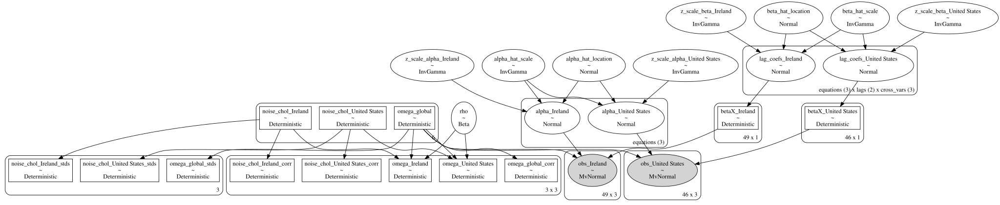

In [28]:
pm.model_to_graphviz(model_full_test)

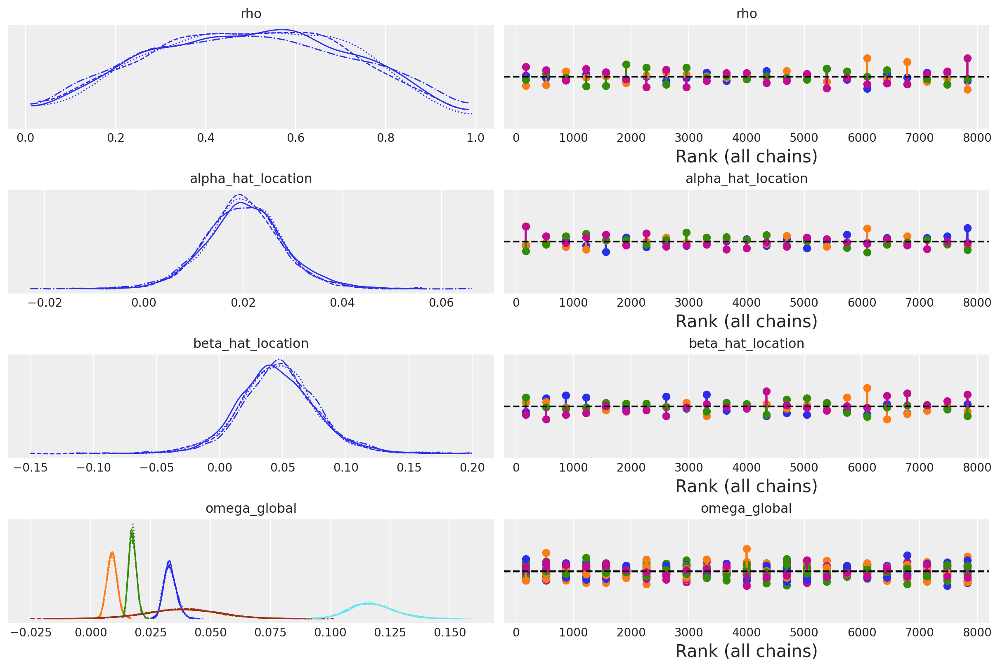

In [29]:
az.plot_trace(
    idata_full_test,
    var_names=["rho", "alpha_hat_location", "beta_hat_location", "omega_global"],
    kind="rank_vlines",
);

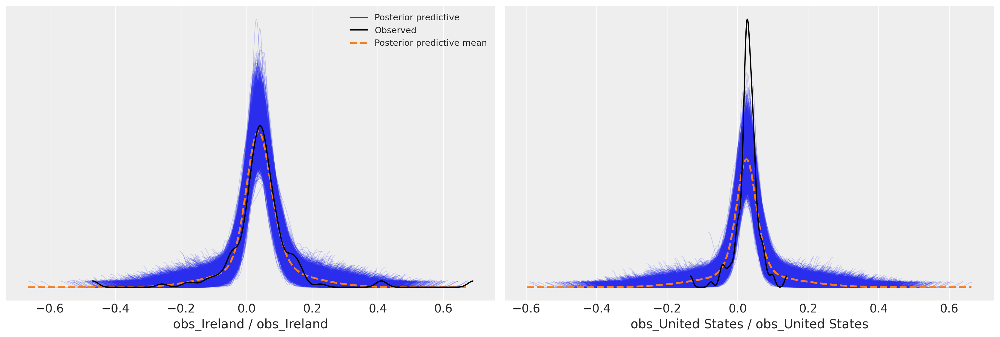

In [30]:
az.plot_ppc(idata_full_test);

In [31]:
az.summary(
    idata_full_test,
    var_names=[
        "rho",
        "alpha_hat_location",
        "alpha_hat_scale",
        "beta_hat_location",
        "beta_hat_scale",
        "omega_global_corr",
        "lag_coefs_Ireland",
        "lag_coefs_United States",
    ],
)

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
rho,0.497,0.222,0.114,0.903,0.003,0.002,7547.0,4197.0,1.00
alpha_hat_location,0.020,0.008,0.006,0.036,0.000,0.000,2862.0,3968.0,1.00
alpha_hat_scale,0.107,0.045,0.042,0.183,0.001,0.000,4392.0,3410.0,1.00
beta_hat_location,0.046,0.032,-0.016,0.106,0.001,0.001,1357.0,2239.0,1.00
beta_hat_scale,0.383,0.258,0.071,0.830,0.011,0.008,538.0,1239.0,1.01
"omega_global_corr[0, 0]",1.000,0.000,1.000,1.000,0.000,0.000,8000.0,8000.0,NaN
"omega_global_corr[0, 1]",0.451,0.087,0.289,0.610,0.001,0.001,6180.0,5615.0,1.00
"omega_global_corr[0, 2]",0.291,0.104,0.086,0.473,0.002,0.001,3860.0,5411.0,1.00
"omega_global_corr[1, 0]",0.451,0.087,0.289,0.610,0.001,0.001,6180.0,5615.0,1.00
"omega_global_corr[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,7342.0,6703.0,1.00


In [32]:
corr = pd.DataFrame(
    az.summary(idata_full_test, var_names=["omega_global_corr"])["mean"].values.reshape(3, 3),
    columns=["GDP", "CONS", "GFCF"],
)
corr.index = ["GDP", "CONS", "GFCF"]
corr

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,GDP,CONS,GFCF
GDP,1.000,0.451,0.291
CONS,0.451,1.000,0.392
GFCF,0.291,0.392,1.000


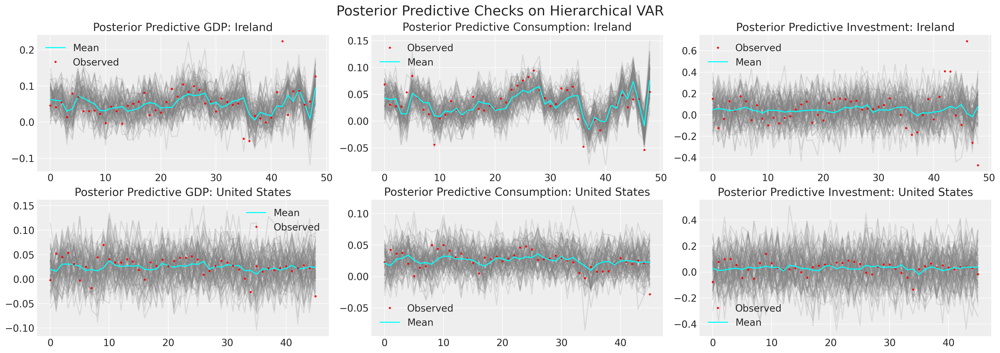

In [33]:
countries = gdp_hierarchical["country"].unique()
countries = ["Ireland", "United States"]
fig, axs = plt.subplots(2, 3, figsize=(20, 7))
for ax, country in zip(axs, countries):
    temp = pd.DataFrame(
        idata_full_test["observed_data"][f"obs_{country}"].data,
        columns=["dl_gdp", "dl_cons", "dl_gfcf"],
    )
    ppc = az.extract_dataset(idata_full_test, group="posterior_predictive", num_samples=100)[
        f"obs_{country}"
    ]
    ax[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color="grey", alpha=0.2)
    ax[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color="cyan", label="Mean")
    ax[0].plot(temp["dl_gdp"], "o", color="red", markersize=2, label="Observed")
    ax[0].set_title(f"Posterior Predictive GDP: {country}")
    ax[0].legend()
    ax[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color="grey", alpha=0.2)
    ax[1].plot(temp["dl_cons"], "o", color="red", markersize=2, label="Observed")
    ax[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color="cyan", label="Mean")
    ax[1].set_title(f"Posterior Predictive Consumption: {country}")
    ax[1].legend()
    ax[2].plot(np.arange(ppc.shape[0]), ppc[:, 2, :], color="grey", alpha=0.2)
    ax[2].plot(temp["dl_gfcf"], "o", color="red", markersize=2, label="Observed")
    ax[2].plot(np.arange(ppc.shape[0]), ppc[:, 2, :].mean(axis=1), color="cyan", label="Mean")
    ax[2].set_title(f"Posterior Predictive Investment: {country}")
    ax[2].legend()
plt.suptitle("Posterior Predictive Checks on Hierarchical VAR", fontsize=20);

Here we can see that the model appears to have recovered reasonable enough posterior predictions for the observed data.

## Conclusion

VAR modelling is a rich an interesting area of research with in economics and there are a range of challenges and pitfalls which come with the interpretation and understanding of these models. We hope this example encourages you to continue exploring the potential of this kind of VAR modelling in the Bayesian framework. Whether you're interested in the relationship between grand economic theory or simpler questions about the impact of poor app performance on customer feedback, VAR models give you a powerful tool for interrogating these relationships over time.

## Authors
* Adapted from the PYMC labs [Blog post](https://www.pymc-labs.io/blog-posts/bayesian-vector-autoregression/) and Jim Savage's discussion [here](https://rpubs.com/jimsavage/hierarchical_var) by [Nathaniel Forde](https://nathanielf.github.io/) in October 2022, 2021 ([pymc-examples#456](https://github.com/pymc-devs/pymc-examples/pull/456))

In [34]:
%load_ext watermark
%watermark -n -u -v -iv -w -p aesara,aeppl,xarray

Last updated: Fri Nov 18 2022

Python implementation: CPython
Python version       : 3.9.0
IPython version      : 8.4.0

aesara: 2.8.7
aeppl : 0.0.38
xarray: 2022.10.0

pandas     : 1.5.1
aesara     : 2.8.7
sys        : 3.9.0 (default, Nov 15 2020, 06:25:35) 
[Clang 10.0.0 ]
statsmodels: 0.13.2
numpy      : 1.23.4
matplotlib : 3.6.1
arviz      : 0.12.1
pymc       : 4.2.2

Watermark: 2.3.1



:::{include} ../page_footer.md
:::